In [6]:
import pandas as pd
data = 'https://raw.githubusercontent.com/sesharaogurijala/data-science-project/refs/heads/main/dft_road_casualty.csv'
df = pd.read_csv(data)
df.head()

/tmp/ipython-input-557880847.py:3: DtypeWarning:

Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.



,collision_index,collision_year,collision_ref_no,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,collision_severity,number_of_vehicles,...,carriageway_hazards_historic,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,enhanced_severity_collision,collision_injury_based,collision_adjusted_severity_serious,collision_adjusted_severity_slight
0,202417H103224,2024,17H103224,448894,532505,-1.24312,54.68523,17,3,2,...,-1,0,1,2,2,E01011983,3,1,0.000000,1.000000
1,202417M217924,2024,17M217924,452135,519436,-1.19517,54.56747,17,3,2,...,-1,0,1,3,2,E01012061,7,1,1.000000,0.000000
2,202417S204524,2024,17S204524,445427,522924,-1.29837,54.59946,17,3,2,...,0,0,2,1,2,E01012280,-1,0,0.111621,0.888379
3,2.02448E+12,2024,481510889,533587,181174,-0.07626,51.51371,48,3,1,...,-1,0,1,1,2,E01000005,7,1,1.000000,0.000000
4,2.02448E+12,2024,481563500,532676,180902,-0.08948,51.51148,48,3,1,...,-1,0,1,1,2,E01032739,5,1,1.000000,0.000000


In [1]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Path to your dataset inside Google Drive
file_path = "/content/drive/MyDrive/dft_road_casualty.csv"

# Import dataset
df = pd.read_csv(file_path, low_memory=False)
print("Dataset Loaded Successfully from Drive")
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")
print("\n Columns:\n", df.columns.tolist())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset Loaded Successfully from Drive
Rows: 101927, Columns: 44

 Columns:
 ['collision_index', 'collision_year', 'collision_ref_no', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'collision_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'local_authority_highway_current', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail_historic', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control_historic', 'pedestrian_crossing_physical_facilities_historic', 'pedestrian_crossing', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards_his

/tmp/ipython-input-1576770060.py:3: DtypeWarning: Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/content/drive/MyDrive/dft_road_casualty.csv")


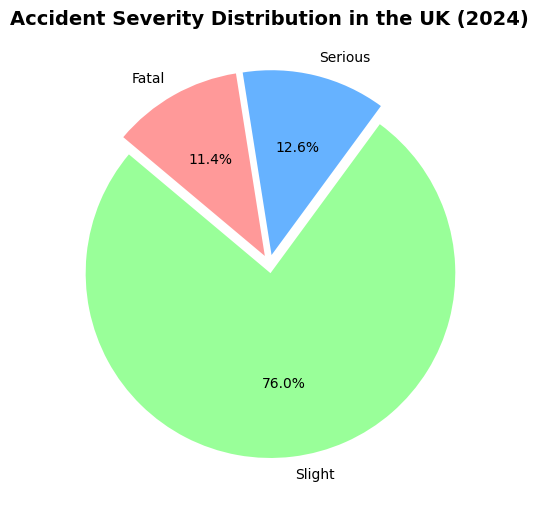

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("/content/drive/MyDrive/dft_road_casualty.csv")
severity_map = {1: 'Fatal', 2: 'Serious', 3: 'Slight'}
if 'collision_severity' in df.columns:
    df['collision_severity'] = df['collision_severity'].map(severity_map)
severity_counts = df['collision_severity'].value_counts()
explode = [0.05] * len(severity_counts)
plt.figure(figsize=(6,6))
plt.pie(
    severity_counts,
    labels=severity_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=['#99FF99','#66B2FF','#FF9999'][:len(severity_counts)],
    explode=explode
)
plt.title('Accident Severity Distribution in the UK (2024)', fontsize=14, weight='bold')
plt.show()


/tmp/ipython-input-827976387.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




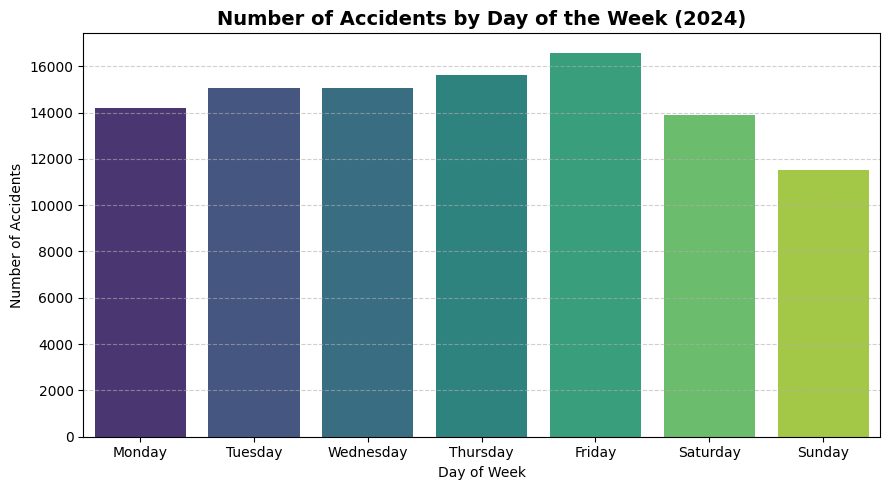

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
df['day_of_week'] = df['day_of_week'].replace({
    1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday',
    5: 'Thursday', 6: 'Friday', 7: 'Saturday'
})
day_counts = df['day_of_week'].value_counts().reindex([
    'Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'
])
plt.figure(figsize=(9,5))
sns.barplot(x=day_counts.index, y=day_counts.values, palette='viridis')
plt.title('Number of Accidents by Day of the Week (2024)', fontsize=14, weight='bold')
plt.xlabel('Day of Week')
plt.ylabel('Number of Accidents')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3992845161.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



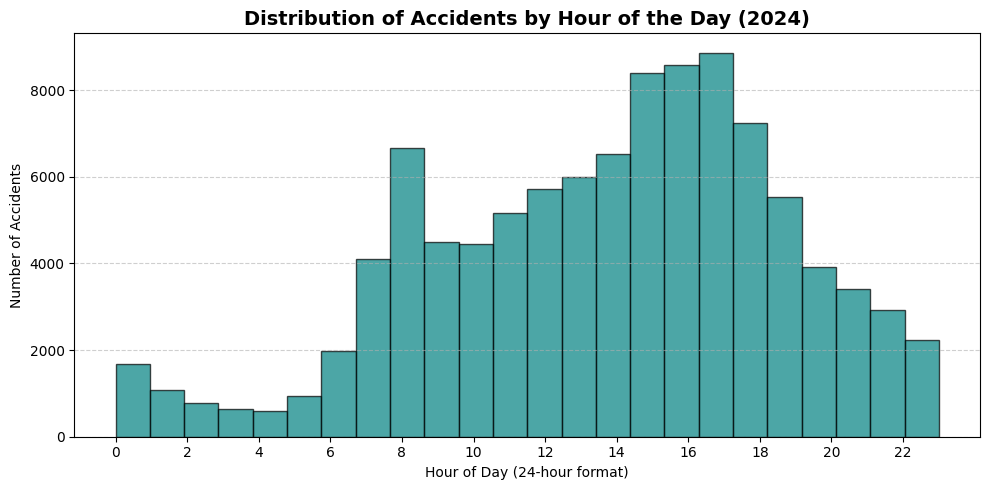

In [ ]:
import numpy as np
df['time'] = pd.to_datetime(df['time'], errors='coerce')
df['hour'] = df['time'].dt.hour
plt.figure(figsize=(10,5))
plt.hist(df['hour'].dropna(), bins=24, color='teal', edgecolor='black', alpha=0.7)
plt.title('Distribution of Accidents by Hour of the Day (2024)', fontsize=14, weight='bold')
plt.xlabel('Hour of Day (24-hour format)')
plt.ylabel('Number of Accidents')
plt.xticks(np.arange(0, 24, 2))
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

/tmp/ipython-input-733465667.py:35: UserWarning:

Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) DejaVu Sans.



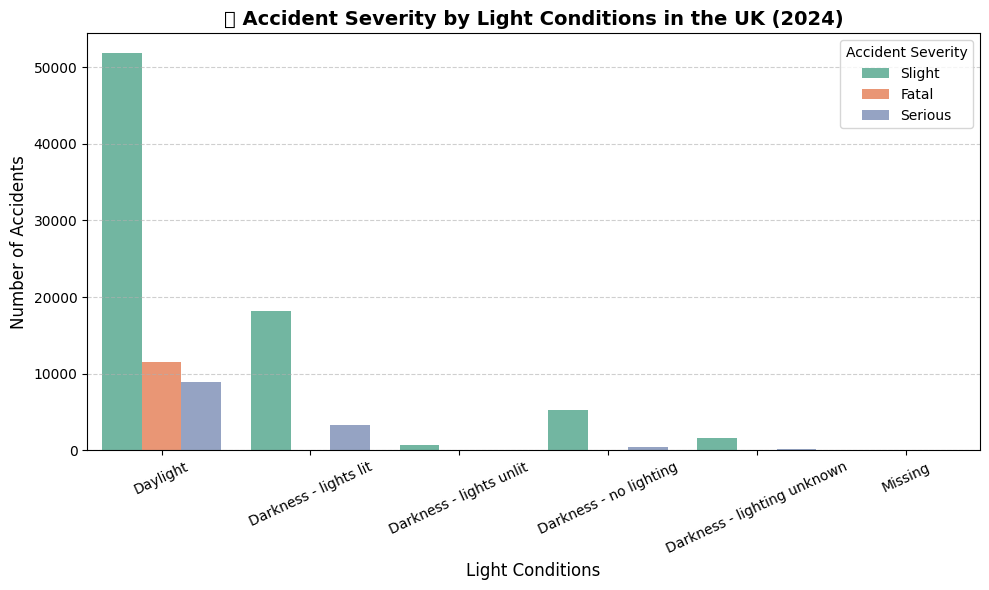

In [ ]:
severity_map = {1: 'Fatal', 2: 'Serious', 3: 'Slight'}
if df['collision_severity'].dtype != 'O':
    df['collision_severity'] = df['collision_severity'].map(severity_map)
light_map = {
    1: 'Daylight',
    4: 'Darkness - lights lit',
    5: 'Darkness - lights unlit',
    6: 'Darkness - no lighting',
    7: 'Darkness - lighting unknown',
    -1: 'Missing'
}
df['light_conditions'] = df['light_conditions'].map(light_map)
df = df.dropna(subset=['light_conditions'])
plt.figure(figsize=(10,6))
sns.countplot(
    x='light_conditions',
    hue='collision_severity',
    data=df,
    order=[
        'Daylight',
        'Darkness - lights lit',
        'Darkness - lights unlit',
        'Darkness - no lighting',
        'Darkness - lighting unknown',
        'Missing'
    ],
    palette='Set2'
)
plt.title('💡 Accident Severity by Light Conditions in the UK (2024)', fontsize=14, weight='bold')
plt.xlabel('Light Conditions', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(rotation=25)
plt.legend(title='Accident Severity')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

/tmp/ipython-input-4162123995.py:20: UserWarning:

Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.



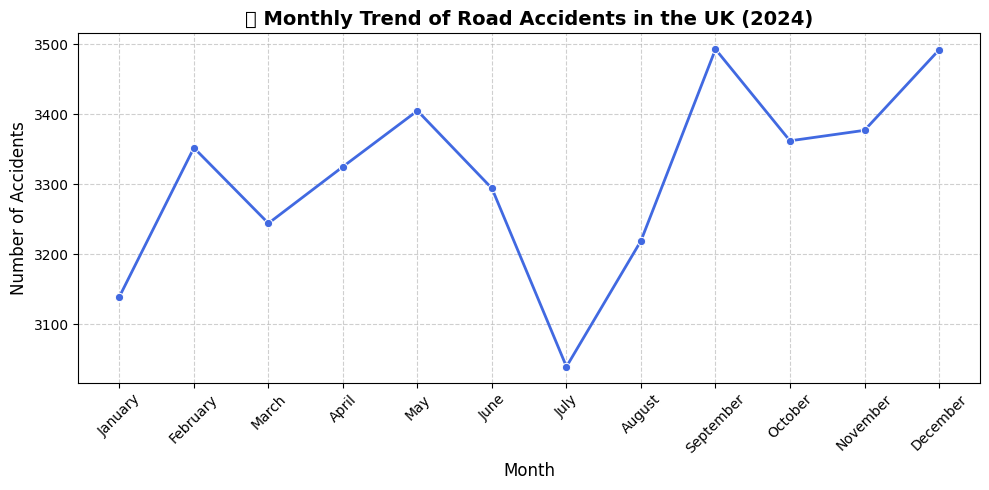

In [ ]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['month'] = df['date'].dt.month_name()
monthly_accidents = df['month'].value_counts().reindex([
    'January','February','March','April','May','June',
    'July','August','September','October','November','December'
])
plt.figure(figsize=(10,5))
sns.lineplot(
    x=monthly_accidents.index,
    y=monthly_accidents.values,
    marker='o',
    linewidth=2,
    color='royalblue'
)
plt.title('📅 Monthly Trend of Road Accidents in the UK (2024)', fontsize=14, weight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

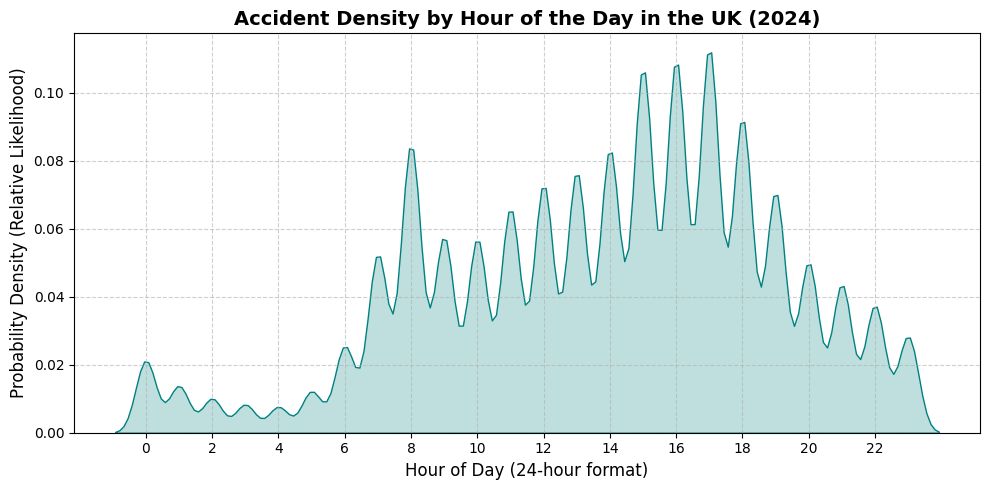

In [ ]:
df['time'] = pd.to_datetime(df['time'], errors='coerce')
df['hour'] = df['time'].dt.hour
df = df.dropna(subset=['hour'])
plt.figure(figsize=(10,5))
sns.kdeplot(data=df, x='hour', fill=True, bw_adjust=0.6, color='teal')
plt.title('Accident Density by Hour of the Day in the UK (2024)', fontsize=14, weight='bold')
plt.xlabel('Hour of Day (24-hour format)', fontsize=12)
plt.ylabel('Probability Density (Relative Likelihood)', fontsize=12)
plt.xticks(np.arange(0, 24, 2))
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

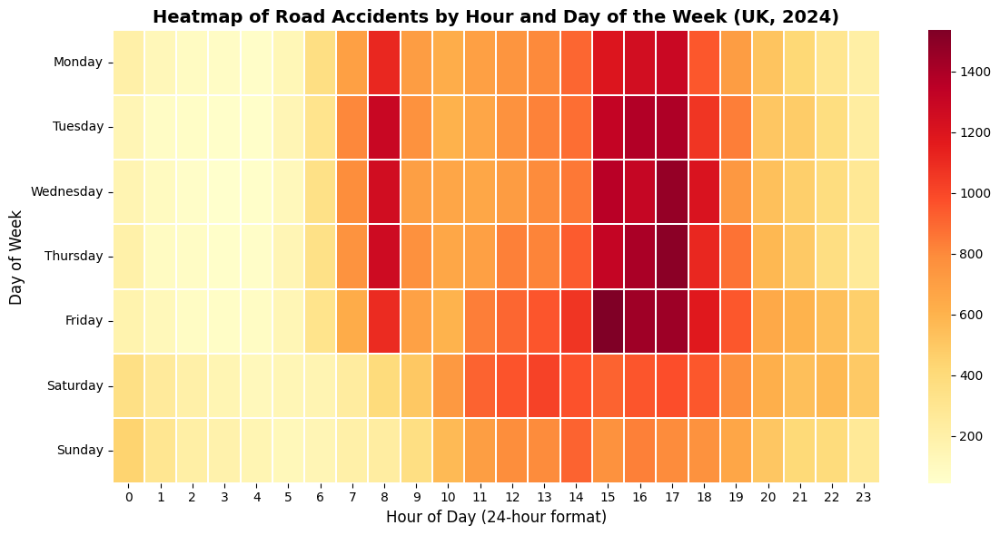

In [ ]:
df['time'] = pd.to_datetime(df['time'], errors='coerce')
df['hour'] = df['time'].dt.hour
df['day_of_week'] = df['day_of_week'].replace({
    1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday',
    5: 'Thursday', 6: 'Friday', 7: 'Saturday'
})
pivot_table = df.pivot_table(
    index='day_of_week',
    columns='hour',
    values='collision_index',
    aggfunc='count'
)
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot_table.reindex(order)
plt.figure(figsize=(12,6))
sns.heatmap(pivot_table, cmap='YlOrRd', linewidths=0.3)
plt.title('Heatmap of Road Accidents by Hour and Day of the Week (UK, 2024)', fontsize=14, weight='bold')
plt.xlabel('Hour of Day (24-hour format)', fontsize=12)
plt.ylabel('Day of Week', fontsize=12)
plt.tight_layout()
plt.show()

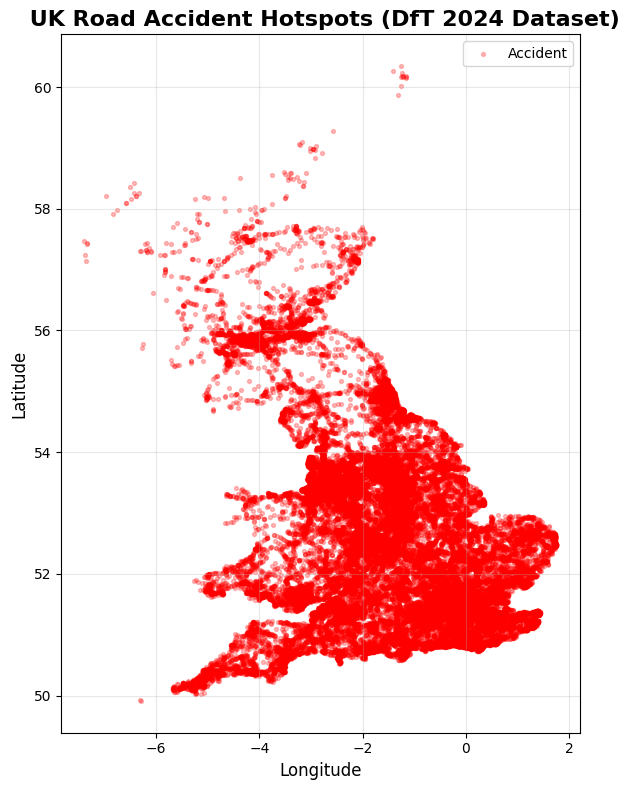

In [ ]:
# --- Clean coordinates ---
df = df.dropna(subset=['longitude', 'latitude'])
df = df[(df['longitude'] != 0) & (df['latitude'] != 0)]

# --- Optional: sample for performance (uncomment if plotting is slow) ---
# df = df.sample(20000, random_state=42)

# --- Create scatter plot ---
plt.figure(figsize=(6, 8))
plt.scatter(
    df['longitude'],
    df['latitude'],
    alpha=0.25,       # transparency to show density
    s=8,              # marker size
    c='red',
    label='Accident'
)

# --- Style & labels ---
plt.title(' UK Road Accident Hotspots (DfT 2024 Dataset)', fontsize=16, weight='bold')
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.legend(loc='upper right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

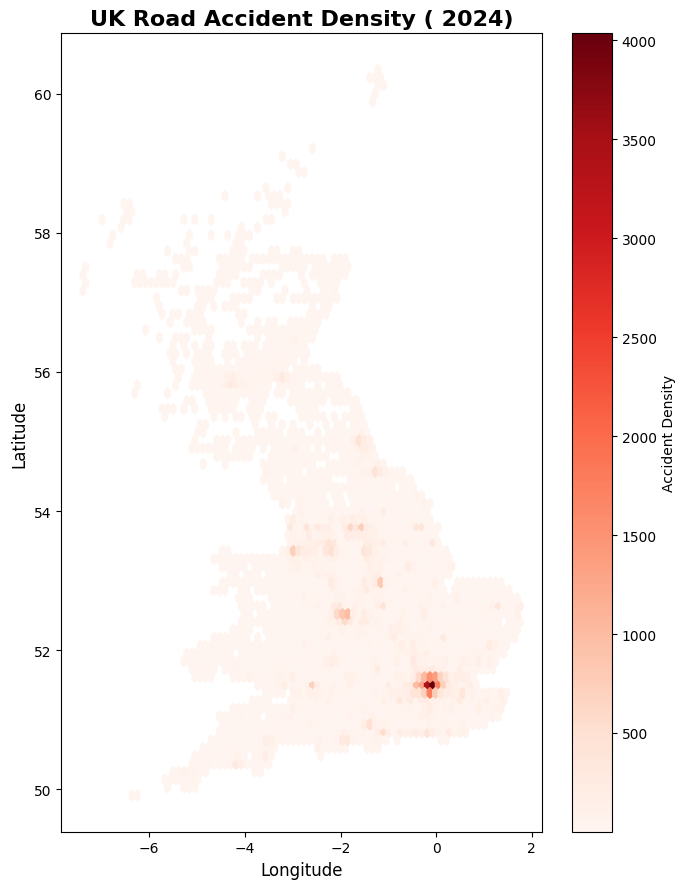

In [ ]:
plt.figure(figsize=(7, 9))
plt.hexbin(df['longitude'], df['latitude'], gridsize=80, cmap='Reds', mincnt=1)
plt.title('UK Road Accident Density ( 2024)', fontsize=16, weight='bold')
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.colorbar(label='Accident Density')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import plotly.express as px
file_path = "/content/drive/MyDrive/dft_road_casualty.csv"

df = pd.read_csv(file_path, low_memory=False)

print("Columns in dataset:", df.columns.tolist()[:10])

df = df.dropna(subset=['longitude', 'latitude'])
df = df[(df['longitude'] != 0) & (df['latitude'] != 0)]

severity_map = {1: 'Fatal', 2: 'Serious', 3: 'Slight'}
if df['collision_severity'].dtype != 'O':
    df['collision_severity'] = df['collision_severity'].map(severity_map)

fig = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="collision_severity",
    zoom=5,
    mapbox_style="open-street-map",
    opacity=0.5,
    hover_data={
        "collision_severity": True,
        "longitude": ':.3f',
        "latitude": ':.3f',
        "number_of_vehicles": True,
        "number_of_casualties": True,
        "police_force": True
    },
    title="UK Road Accident Hotspots (DfT 2024 Full Dataset)"
)

fig.show()


Columns in dataset: ['collision_index', 'collision_year', 'collision_ref_no', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'collision_severity', 'number_of_vehicles']


Columns: ['collision_index', 'collision_year', 'collision_ref_no', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'collision_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'local_authority_highway_current', 'first_road_class', 'first_road_number']
Target column: collision_severity
Using features: ['number_of_vehicles', 'light_conditions', 'weather_conditions', 'urban_or_rural_area', 'day_of_week', 'speed_limit']
Rows after cleaning: 101927
Train size: 81541
Test size: 20386

Class distribution after SMOTE:
collision_severity
Slight     61999
Fatal      61999
Serious    61999
Name: count, dtype: int64

=== RANDOM FOREST RESULTS ===
Accuracy: 0.8856

Classification Report:

              precision    recall  f1-score   support

       Fatal       0.95      0.98      0.96      2322
     Serious       0.57      0.41    

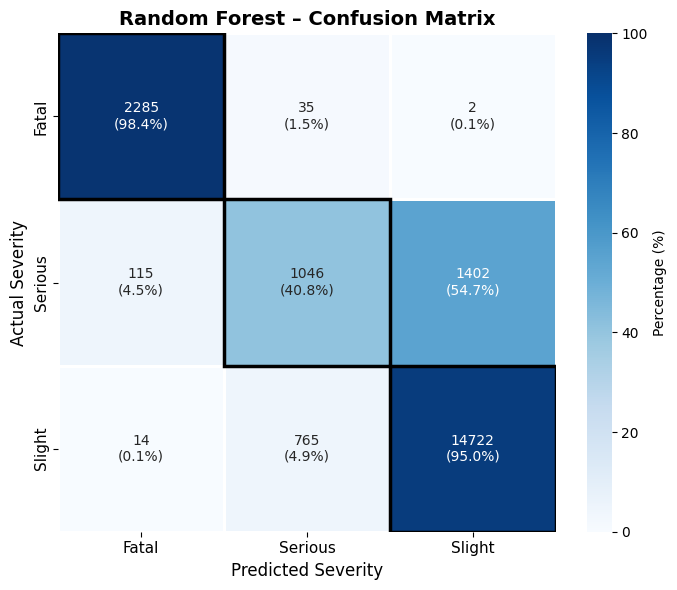

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import SMOTE

file_path = "/content/drive/MyDrive/dft_road_casualty.csv"
df = pd.read_csv(file_path, low_memory=False)

df.columns = (
    df.columns
    .str.lower()
    .str.strip()
    .str.replace(" ", "_")
)

print("Columns:", df.columns.tolist()[:20])

target_candidates = [c for c in df.columns if "severity" in c]
if not target_candidates:
    raise ValueError("No severity column found")

target_col = target_candidates[0]
print("Target column:", target_col)

if df[target_col].dtype != "O":
    severity_map = {1: "Fatal", 2: "Serious", 3: "Slight"}
    df[target_col] = df[target_col].map(severity_map)

features = [
    "number_of_vehicles",
    "light_conditions",
    "weather_conditions",
    "urban_or_rural_area",
    "day_of_week",
    "speed_limit"
]

features = [f for f in features if f in df.columns]
print("Using features:", features)

df = df[features + [target_col]].dropna()

if df.empty:
    raise ValueError("Dataset empty after cleaning")

print(f"Rows after cleaning: {len(df)}")

X = df[features]
y = df[target_col]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Train size:", len(X_train))
print("Test size:", len(X_test))

label_encoders = {}

for col in features:
    if X_train[col].dtype == "O":
        le = LabelEncoder()
        X_train[col] = le.fit_transform(X_train[col])
        X_test[col] = le.transform(X_test[col])
        label_encoders[col] = le

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

print("\nClass distribution after SMOTE:")
print(y_train_bal.value_counts())

scaler = StandardScaler()
X_train_bal = scaler.fit_transform(X_train_bal)
X_test = scaler.transform(X_test)

rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train_bal, y_train_bal)

y_pred = rf.predict(X_test)

print("\n=== RANDOM FOREST RESULTS ===")
print("Accuracy:", round(accuracy_score(y_test, y_pred), 4))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

class_order = ["Fatal", "Serious", "Slight"]
cm = confusion_matrix(y_test, y_pred, labels=class_order)

cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100

annot = np.empty_like(cm).astype(str)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        annot[i, j] = f"{cm[i, j]}\n({cm_pct[i, j]:.1f}%)"

plt.figure(figsize=(7, 6))

sns.heatmap(
    cm_pct,
    annot=annot,
    fmt="",
    cmap="Blues",
    vmin=0,
    vmax=100,
    xticklabels=class_order,
    yticklabels=class_order,
    linewidths=1,
    linecolor="white",
    cbar_kws={"label": "Percentage (%)"}
)
for i in range(len(class_order)):
    plt.gca().add_patch(
        plt.Rectangle(
            (i, i), 1, 1,
            fill=False,
            edgecolor="black",
            linewidth=2.5
        )
    )

plt.title(
    "Random Forest – Confusion Matrix",
    fontsize=14,
    weight="bold"
)
plt.xlabel("Predicted Severity", fontsize=12)
plt.ylabel("Actual Severity", fontsize=12)

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

plt.tight_layout()
plt.show()


Rows after cleaning: 101927

Class distribution after SMOTE:
collision_severity
Slight     61999
Fatal      61999
Serious    61999
Name: count, dtype: int64

=== KNN RESULTS ===
Accuracy: 0.9112

Classification Report:

              precision    recall  f1-score   support

       Fatal       0.95      0.98      0.96      2322
     Serious       0.81      0.39      0.53      2563
      Slight       0.91      0.99      0.95     15501

    accuracy                           0.91     20386
   macro avg       0.89      0.79      0.81     20386
weighted avg       0.90      0.91      0.90     20386



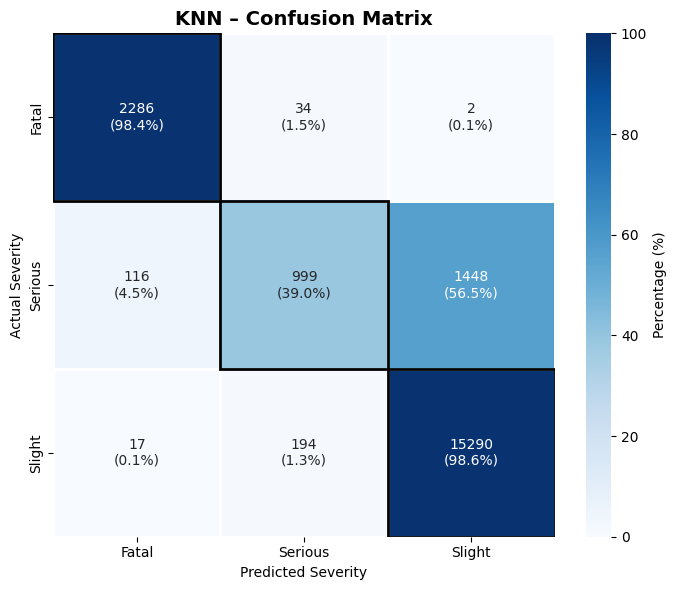

In [ ]:
# KNN
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier

from imblearn.over_sampling import SMOTE
file_path = "/content/drive/MyDrive/dft_road_casualty.csv"
df = pd.read_csv(file_path, low_memory=False)

df.columns = df.columns.str.lower().str.strip().str.replace(" ", "_")

target_col = [c for c in df.columns if "severity" in c][0]
if df[target_col].dtype != "O":
    df[target_col] = df[target_col].map({1: "Fatal", 2: "Serious", 3: "Slight"})

features = [
    "number_of_vehicles",
    "light_conditions",
    "weather_conditions",
    "urban_or_rural_area",
    "day_of_week",
    "speed_limit"
]

features = [f for f in features if f in df.columns]

df = df[features + [target_col]].dropna()

print("Rows after cleaning:", len(df))

X = df[features]
y = df[target_col]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)

label_encoders = {}

for col in features:
    if X_train[col].dtype == "O":
        le = LabelEncoder()
        X_train[col] = le.fit_transform(X_train[col])
        X_test[col] = le.transform(X_test[col])
        label_encoders[col] = le

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_scaled, y_train)

print("\nClass distribution after SMOTE:")
print(y_train_bal.value_counts())

knn = KNeighborsClassifier(
    n_neighbors=7,
    weights="distance",
    metric="minkowski"
)

knn.fit(X_train_bal, y_train_bal)

y_pred = knn.predict(X_test_scaled)

print("\n=== KNN RESULTS ===")
print("Accuracy:", round(accuracy_score(y_test, y_pred), 4))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

class_order = ["Fatal", "Serious", "Slight"]
cm = confusion_matrix(y_test, y_pred, labels=class_order)

cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100

annot = np.empty_like(cm).astype(str)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        annot[i, j] = f"{cm[i, j]}\n({cm_pct[i, j]:.1f}%)"

plt.figure(figsize=(7,6))
sns.heatmap(
    cm_pct,
    annot=annot,
    fmt="",
    cmap="Blues",
    vmin=0,
    vmax=100,
    xticklabels=class_order,
    yticklabels=class_order,
    linewidths=1,
    linecolor="white",
    cbar_kws={"label": "Percentage (%)"}
)

for i in range(len(class_order)):
    plt.gca().add_patch(
        plt.Rectangle((i, i), 1, 1, fill=False, edgecolor="black", linewidth=2)
    )

plt.title("KNN – Confusion Matrix", fontsize=14, weight="bold")
plt.xlabel("Predicted Severity")
plt.ylabel("Actual Severity")
plt.tight_layout()
plt.show()


In [4]:
#K-MEANS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import plotly.express as px

file_path = "/content/drive/MyDrive/dft_road_casualty.csv"
df = pd.read_csv(file_path, low_memory=False)

df.columns = df.columns.str.lower().str.strip().str.replace(" ", "_")

cols_needed = ['longitude', 'latitude']
for c in ['accident_severity', 'collision_severity']:
    if c in df.columns:
        cols_needed.append(c)
        target_col = c
        break

geo_df = df[cols_needed].dropna()
geo_df = geo_df[(geo_df['longitude'] != 0) & (geo_df['latitude'] != 0)]

print(f"Cleaned dataset contains {len(geo_df)} valid accident locations.")

severity_map = {1: 'Fatal', 2: 'Serious', 3: 'Slight'}
if geo_df[target_col].dtype != 'O':
    geo_df[target_col] = geo_df[target_col].map(severity_map)

coords = geo_df[['longitude', 'latitude']].values
k = 8
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
geo_df['cluster'] = kmeans.fit_predict(coords)

print("K-Means clustering complete. Found", k, "hotspots.")

fig = px.scatter_mapbox(
    geo_df,
    lat="latitude",
    lon="longitude",
    color="cluster",
    hover_data={target_col: True},
    zoom=5,
    mapbox_style="carto-positron",
    title="UK Road Accident Hotspots (K-Means Clustering)"
)
fig.show()


Cleaned dataset contains 101927 valid accident locations.
K-Means clustering complete. Found 8 hotspots.


In [5]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

coords_scaled = StandardScaler().fit_transform(coords)

db = DBSCAN(eps=0.2, min_samples=10).fit(coords_scaled)
geo_df['db_cluster'] = db.labels_

n_clusters = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
print(f"DBSCAN found {n_clusters} clusters (and noise points).")

fig = px.scatter_mapbox(
    geo_df,
    lat="latitude",
    lon="longitude",
    color="db_cluster",
    hover_data={target_col: True},
    zoom=5,
    mapbox_style="open-street-map",
    title="UK Road Accident Hotspots (DBSCAN Density Clustering)"
)
fig.show()


DBSCAN found 4 clusters (and noise points).
